## Homework 10
**Total Points: 5**

**Instructions:**
1. Complete parts 1 through 5, filling in code or responses where marked with `# YOUR CODE HERE` or `# YOUR ANALYSIS HERE`.
2. The libraries you need have already been coded. Do not import additional libraries or move import commands.
3. When finished, run the full notebook by selecting <b>Kernel > Restart & Run All</b>. </li>
4. Submit this completed notebook file to <b>NYU Classes</b>. </li>

In this assignment you will use Dynamic Time Warping (DTW) to compare the similarity of different audio files. The audio folder included with this homework contains:

**audio1a.wav** and **audio1b.wav** - Two versions of the same song (instrumental), both recorded in a professional recording studio.

**audio2a.wav**, **audio2b.wav**, and **audio2c.wav** - Three versions of the same song with vocals, recorded in different conditions.

**Grading:** Each part is worth 1 point.

This assignment uses `dtw-python` which can be installed with the following command:

`pip install dtw-python`

**Important:** Use the `dtw-python` package and *not* the `dtw` package. If you installed `dtw` by mistake, uninstall it and re-install `dtw-python`, as there may be compatibility issues.

In [1]:
import numpy as np
import librosa
import IPython.display as ipd
from scipy.spatial import distance
from dtw import *
import matplotlib.pyplot as plt

%matplotlib inline

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



## Part 1: Extract MFCCs

Write a function `extract_mfccs()` which returns MFCCs features as computed by `librosa.features.mfcc`, as well as the audio array. Use the default parameters. The function should also allow you to choose whether or not to return delta MFCCs to account for change over time. Use `librosa.feature.delta` for this.

In [2]:
def extract_mfccs(audio_path, delta=True):
    """Extreact MFCCs (librosa default parameters) from an audio file
    
    Parameters
    ----------
    audio_path : str
        Path to input audio file
    delta : bool
        Whether or not to return delta-MFCCs

    Returns
    -------
    mfccs : np.ndarray, shape=(n, num_mfccs)
        MFCC feature set
    audio : np.array, shape=(num_samples,)
        audio for playback
    fs : int, sample rate

    """

    data, fs = librosa.load( audio_path )
    mfcc = librosa.feature.mfcc( y = data, sr = fs )
    
    if delta: 
        mfcc_delta = librosa.feature.delta( mfcc )
        return mfcc, mfcc_delta, data, fs
    
    else:
        return mfcc , data, fs

## Part 2: Dynamic Time Warping

Create a function `my_dtw()` which takes two time series (MFCCs) and outputs a DTW matrix. 

1. Follow the algorithm *exactly* as in the slides.
2. Do not use contstraints, even though this will dramatically increase the calculation time.
2. Use `scipy.spatial.distance.euclidean` to calculate the distances.

In [3]:
def my_dtw(query, reference):
    """Compute a DTW matrix
    
    Parameters
    ----------
    query : np.array, shape = (num_features, query_len)
        query timeseries
    reference : np.array, shape = (num_features, reference_len)
        reference timeseries
        
    Returns
    -------
    dtw_matrix : np.ndarray, shape=(query_len, referene_len)
        dtw matrix where each axis is the lengths of query/refernce
        

    """
    # Get shapes
    query_len = query.shape[1]
    reference_len = reference.shape[1]
    
    # Create placeholder initialized to infinity
    dtw_matrix = np.full((query_len , reference_len), np.inf)
    
    # Set starting point to 0
    dtw_matrix[0,0] = 0
    
    # Compare previous three grid's cost and update 
    # the current grid cost with the minimum cost from before.
    # Excluding the first row and column.
    for i in range( 1, query_len ):
        for j in range( 1, reference_len ):
            cost = distance.euclidean( query[:, i] , reference[:, j] )
            dtw_matrix[i, j] = cost + min( dtw_matrix[ i , j-1 ],
                                              dtw_matrix[ i-1, j ],
                                              dtw_matrix[ i-1, j-1 ] )
            
    return dtw_matrix

## Part 3: Warp Path
    
Create a function `get_warp_path()` where the input is a DTW matrix  and the output is a matrix with the same dimensions as the input, but where each cell is a 0 except for a cell in the warp path, which is a 1. Remember that the warp path the the least cost (smallest number path) between $D[0,0]$ and $D[n,m]$.  Remember that the warp path must follow a path from the beginning to the end; so using `argmin` on an entire column may not work. 

**Hint**: You may get better results if you work your way back from the end of the matrix (end of both timeseries), following the path with the least cost backwards.

In [4]:
def get_warp_path(dtw_matrix):
    """Get the warp path (best relationship between query and reference) from the DTW matrix
    
    Parameters
    ----------
    dtw_matrix : np.ndarray, shape=(query_len, reference_len)
        dtw matrix where each axis is the lengths of query and refernce
        
    Returns
    -------
    warp : np.ndarray, shape=(query_len, reference_len)
        warp path matrix where all elements are 0 except the warp path, which is 1

    """
    # Unpacking dimensions
    ( num_rows, num_cols ) = dtw_matrix.shape
    
    i = num_rows - 1
    j = num_cols - 1
    
    # Going from end to start, set current grid to 1,
    # find the smallest value from the grid that's 
    # above, to the left, and across the current grid.
    # Set irrelavent values to zero, and move to new grid
    while i > 0 and j > 0:
        dtw_matrix[i, j] = 1
        # Create a candidate array that contains three directions:
        # Left, Across, Up
        candidate = np.array( [dtw_matrix[i, j-1], 
                               dtw_matrix[i-1, j-1],
                               dtw_matrix[i-1, j]] )
        
        direction = np.argmin( candidate )
        # Going left
        if direction == 0:
            dtw_matrix[ i: , j-1 ] = 0
            j -= 1
        # Going across
        if direction == 1:
            dtw_matrix[ i:, j-1 ] = 0
            dtw_matrix[ i-1 , j: ] = 0
            i -= 1
            j -= 1
        # Going up
        if direction == 2:
            dtw_matrix[ i-1 , j: ] = 0
            i -= 1
    # Setting the last (start) value to 1
    dtw_matrix[i , j] = 1

    return dtw_matrix

array([[0.        ,        inf,        inf],
       [       inf, 0.82129217, 1.42942407],
       [       inf, 1.41390362, 1.14613955],
       [       inf, 2.12062027, 1.46872384],
       [       inf, 2.86355895, 2.48108166]])

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.]])

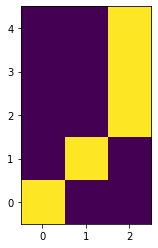

In [5]:
# I commented out the test1 and test2 because my_dtw function takes in 2 dimensional arrays.
# I can write a separate one that takes in 1d arrays, but I don't think it's neccessary for 
# mfcc inputs which are 2-dimensional. 

# test1 = np.array([1, 0, 1, 0, 1, 0, 1])
# test2 = np.array([1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1])

np.random.seed(0)
test1 = np.random.rand(3, 5)
test2 = np.random.rand(3, 3)

# USE THIS CODE TO TEST DTW WITH THE DTW-PYTHON PACKAGE

# test_dtw = dtw(test1, test2)
# test_dtw.plot()

# UNCOMMENT FOR YOUR TEST

a = my_dtw(test1, test2)
display(a)

warp = get_warp_path(a)
display( warp )
plt.imshow(warp,origin='bottom')

## Part 4: Plot and Sonify
    
Plot the warp path (using either `plot` or `imshow`) from the DTW matrix:

- The Y-axis should show the reference time series
- The X-axis should show the query time series

Then, using the warp path matrix and the code below, create 2 IPython audio objects that begin playing at any given matching point for any two audio files. For example, if frame 100 in time series A is warped to frame 120 in time series B, your two audio players should start at those points. Try this with several different `reference_position` values to see how well the algorithm works. Also remember to convert frames back to samples before passing the audio to `IPython.Audio`.

In [6]:
# USE THIS CODE TO MATCH AN ARBITRARY REFERENCE POSITION TO THE QUERY POSITION

# warp = get_warp_path(dtw_matrix)
# reference_position = [reference frame number]
# query_position = np.argmax(warp[reference_position,:])

In [7]:
def plot( ref_audio_path, query_audio_path ):

    # Get MFCC
    mfcc_ref, mfcc_delta_ref, data_ref, fs_ref = extract_mfccs( ref_audio_path )
    mfcc_query, mfcc_delta_query, data_query, fs_query = extract_mfccs( query_audio_path )
    
    # GET dtw and path matrix
    dtw = my_dtw( mfcc_query, mfcc_ref )
    path = get_warp_path( dtw )
    
    # Get time vectors for plotting
    time_ref = len( data_ref ) / fs_ref
    time_query = len( data_query ) / fs_query
    time_vector_ref = np.linspace( 0, time_ref, path.shape[1])
    time_vector_query = np.linspace( 0, time_query, path.shape[0])
    
    # Plot path
    plt.figure( figsize = ( 8, 8 ))
    plt.xlabel( "Reference Track (seconds)")
    plt.ylabel( "Query Track (seconds)")
    plt.title( "Dynamic Time Warping")
    plt.pcolormesh( time_vector_ref , time_vector_query, path )
    plt.tight_layout()
    plt.show()

    return path, data_ref, data_query, fs_ref, fs_query
    

In [8]:
def plot_with_delta( ref_audio_path, query_audio_path ):

    # Get MFCC
    mfcc_ref, mfcc_delta_ref, data_ref, fs_ref = extract_mfccs( ref_audio_path )
    mfcc_query, mfcc_delta_query, data_query, fs_query = extract_mfccs( query_audio_path )
    
    # GET dtw and path matrix
    dtw = my_dtw( mfcc_delta_query, mfcc_delta_ref )
    path = get_warp_path( dtw )
    
    # Get time vectors for plotting
    time_ref = len( data_ref ) / fs_ref
    time_query = len( data_query ) / fs_query
    time_vector_ref = np.linspace( 0, time_ref, path.shape[1])
    time_vector_query = np.linspace( 0, time_query, path.shape[0])
    
    # Plot path
    plt.figure( figsize = ( 8, 8 ))
    plt.xlabel( "Reference Track (seconds)")
    plt.ylabel( "Query Track (seconds)")
    plt.title( "Dynamic Time Warping")
    plt.pcolormesh( time_vector_ref , time_vector_query, path )
    plt.tight_layout()
    plt.show()

    return path, data_ref, data_query, fs_ref, fs_query
    

In [9]:
def sonify( path, data_ref, data_query, fs_ref, fs_query , start_position):
    """
    start_position: float between 0 to 1 (inclusive), to choose playback position
    """
    
    # Convert ref start position to query start position
    reference_position = int( path.shape[1] * start_position )
    query_mfcc_frame = np.argmax( path[ : , reference_position ] )
    query_position = query_mfcc_frame / path.shape[0] 
    query_position_sample_position = int( len(data_query) * query_position )    

    # Slice reference and query audio data using their corresponding start positions
    reference_sample_position = int( len( data_ref ) * start_position )
    data_ref_sliced = data_ref[ reference_sample_position: ]
    audio_ref = ipd.Audio( data_ref_sliced, rate = fs_ref)
    data_query_sliced = data_query[ query_position_sample_position: ]
    audio_query = ipd.Audio( data_query_sliced, rate = fs_query )
    
    # Play audio
    print( "Playing reference audio at ", int( start_position * 100), '%' )
    ipd.display(audio_ref)
    
    print( "Playing query audio at ", int( start_position * 100), "% (warped)")
    ipd.display(audio_query)
    
    return

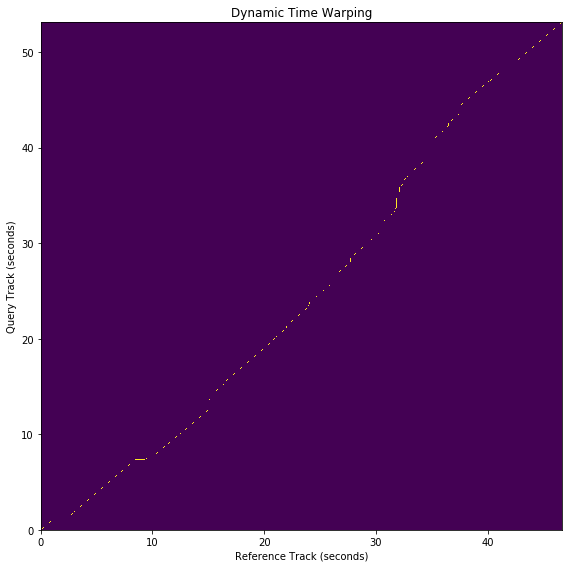

In [10]:
ref = "audio/audio1a.wav"
query = "audio/audio1b.wav"

path, data_ref, data_query, fs_ref, fs_query = plot( ref, query )

In [11]:
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.7)

Playing reference audio at  70 %


Playing query audio at  70 % (warped)


## Part 5: Analysis

Given that Dynamic Time Warping requires two time series, a reference and a query, develop a method for analyzing the success of the algorithm. How would you quantify results? What additional data (if any) would you need to be able to improve the accuracy of your metrics? If you use existing research, please cite your sources in your analysis.

A few things to consider:

1. Each cell is the cost of the path from $DTW[0,0]$ to that cell. The smaller the number, the closer the match. What cell would be most indicative of an overall similarity score for the entire song?
2. Compare MFCCs to delta-MFCCs and note the differennces, if any.
3. Run DTW on two different songs (not different versions of the same song). What happens?
4. You are provided one song with three versions. Which versions are the closest match? How do you know?
5. Which seems to work better: Audio with vocals or audio without vocals?

Feel free to use your own music (two click tracks of different speeds may be helpful) and create plots as necessary in your analysis.

`Let's first plot and sonify a few pairs of audio 2`

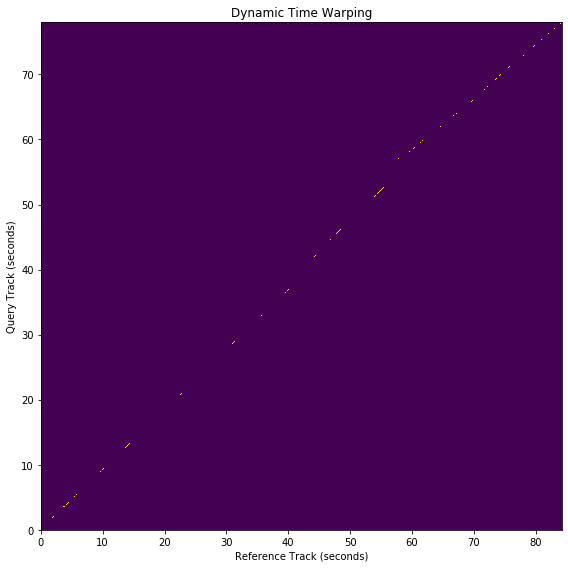

Playing reference audio at  70 %


Playing query audio at  70 % (warped)


In [12]:
ref = "audio/audio2a.wav"
query = "audio/audio2b.wav"

path, data_ref, data_query, fs_ref, fs_query = plot( ref, query )
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.7)

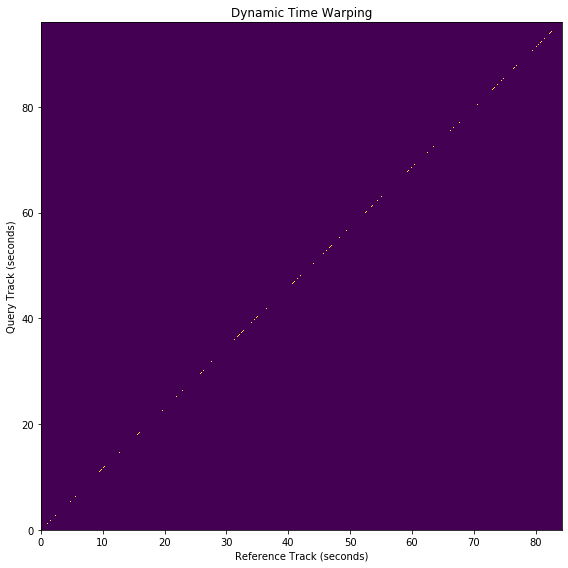

Playing reference audio at  70 %


Playing query audio at  70 % (warped)


In [13]:
ref = "audio/audio2a.wav"
query = "audio/audio2c.wav"

path, data_ref, data_query, fs_ref, fs_query = plot( ref, query )
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.7)

`From the comparison between the sound and graphs, it seems that the algorithm performs well on both cases, though it can be speculated that the difference between 2a and 2c is smaller than the difference between 2a and 2b. This conclusion is derived from both the graph, where the non-linearity is greater, and the recording.`

`Below, we see the comparison between two completely different tracks. `

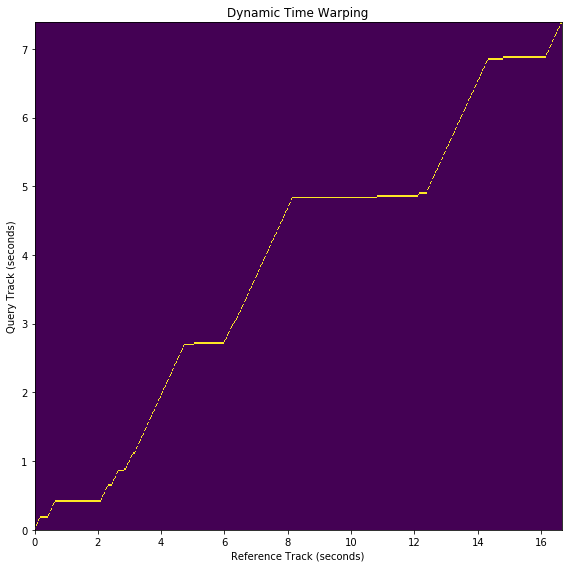

Playing reference audio at  50 %


Playing query audio at  50 % (warped)


In [14]:
ref = "audio/voice.aif"
query = "audio/drums.aif"

path, data_ref, data_query, fs_ref, fs_query = plot( ref, query )
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.5)

`We see that the graph is completely non-linear, which is also reflected in the recording. This lead me to suspect to examine the linearity of the dtw_path as a measure of similarity between the two tracks, using the dtw algorithm`

`Before I go furture with that idea, let's see what using mfcc_delta do to the path matrix`

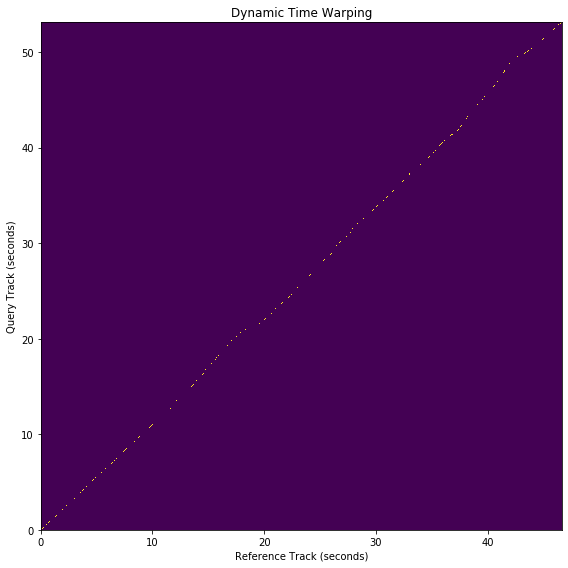

Playing reference audio at  70 %


Playing query audio at  70 % (warped)


In [15]:
ref = "audio/audio1a.wav"
query = "audio/audio1b.wav"

path, data_ref, data_query, fs_ref, fs_query = plot_with_delta( ref, query )
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.7)

`It looks like the path becomes somewhat smoother, let's compare a few different click tracks to be sure. To be able to do that, I redefined some functions, so they take audio data array as input, rather than audio filepath`

In [16]:
def extract_mfccs_array(audio, rate, delta=True):
    """Extreact MFCCs (librosa default parameters) from an audio file
    
    Parameters
    ----------
    audio : np.array
        audio data
    rate : int
        sample rate of audio data
    delta : bool
        Whether or not to return delta-MFCCs

    Returns
    -------
    mfccs : np.ndarray, shape=(n, num_mfccs)
        MFCC feature set
    audio : np.array, shape=(num_samples,)
        audio for playback
    fs : int, sample rate

    """

    data = audio
    fs = rate
    mfcc = librosa.feature.mfcc( y = data, sr = fs )
    
    if delta: 
        mfcc_delta = librosa.feature.delta( mfcc )
        return mfcc, mfcc_delta, data, fs
    
    else:
        return mfcc , data, fs

In [17]:
def plot_with_array( ref_audio_data, query_audio_data, rate ):

    # Get MFCC
    mfcc_ref, mfcc_delta_ref, data_ref, fs_ref = extract_mfccs_array(ref_audio_data, rate, delta=True)
    mfcc_query, mfcc_delta_query, data_query, fs_query = extract_mfccs_array(query_audio_data, rate, delta=True)
    
    # GET dtw and path matrix
    dtw = my_dtw( mfcc_query, mfcc_ref )
    path = get_warp_path( dtw )
    
    # Get time vectors for plotting
    time_ref = len( data_ref ) / fs_ref
    time_query = len( data_query ) / fs_query
    time_vector_ref = np.linspace( 0, time_ref, path.shape[1])
    time_vector_query = np.linspace( 0, time_query, path.shape[0])
    
    # Plot path
    plt.figure( figsize = ( 8, 8 ))
    plt.xlabel( "Reference Track (seconds)")
    plt.ylabel( "Query Track (seconds)")
    plt.title( "Dynamic Time Warping")
    plt.pcolormesh( time_vector_ref , time_vector_query, path )
    plt.tight_layout()
    plt.show()

    return path, data_ref, data_query, fs_ref, fs_query
    

In [18]:
def plot_with_array_delta( ref_audio_data, query_audio_data, rate ):

    # Get MFCC
    mfcc_ref, mfcc_delta_ref, data_ref, fs_ref = extract_mfccs_array(ref_audio_data, rate, delta=True)
    mfcc_query, mfcc_delta_query, data_query, fs_query = extract_mfccs_array(query_audio_data, rate, delta=True)
    
    # GET dtw and path matrix
    dtw = my_dtw( mfcc_delta_query, mfcc_delta_ref )
    path = get_warp_path( dtw )
    
    # Get time vectors for plotting
    time_ref = len( data_ref ) / fs_ref
    time_query = len( data_query ) / fs_query
    time_vector_ref = np.linspace( 0, time_ref, path.shape[1])
    time_vector_query = np.linspace( 0, time_query, path.shape[0])
    
    # Plot path
    plt.figure( figsize = ( 8, 8 ))
    plt.xlabel( "Reference Track (seconds)")
    plt.ylabel( "Query Track (seconds)")
    plt.title( "Dynamic Time Warping")
    plt.pcolormesh( time_vector_ref , time_vector_query, path )
    plt.tight_layout()
    plt.show()

    return path, data_ref, data_query, fs_ref, fs_query
    

In [19]:
# Makes click track audio data arrays
def make_click( bpm, sample_rate, duration ):
    y = np.zeros(sample_rate * duration)
    for i in range (len(y)):
        if i % ( np.floor( sample_rate / ( bpm / 60) ) ) == 0:
            y[i] = 1

    _, beat = librosa.beat.beat_track(y=y, start_bpm = bpm, sr=sample_rate)
    y_beats = librosa.clicks(frames=beat, sr=sample_rate)
    audio = ipd.Audio(y_beats, rate = sample_rate)
    ipd.display( audio )
    return y_beats, sample_rate

In [20]:
click1, rate = make_click( 200, 44100, 5 )

In [21]:
click2, rate = make_click( 100, 44100, 10 )

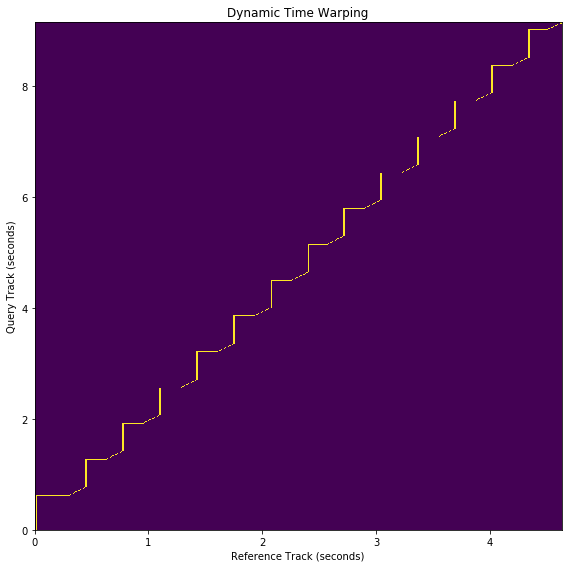

Playing reference audio at  70 %


Playing query audio at  70 % (warped)


In [22]:
ref = click1
query = click2

path, data_ref, data_query, fs_ref, fs_query = plot_with_array( ref,query, rate = 41000 )
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.7)

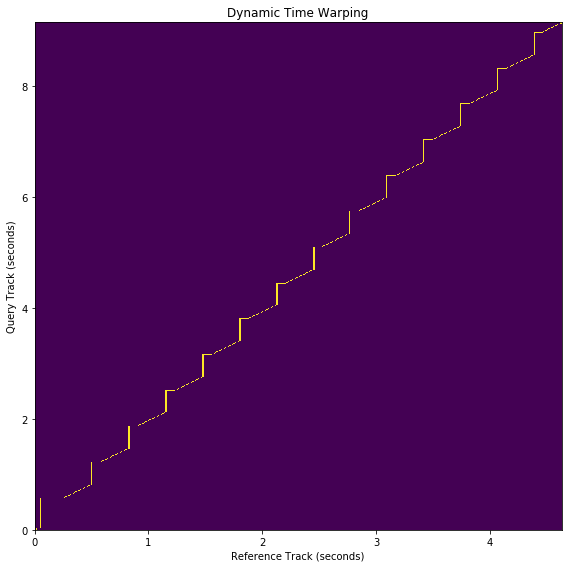

Playing reference audio at  70 %


Playing query audio at  70 % (warped)


In [23]:
path, data_ref, data_query, fs_ref, fs_query = plot_with_array_delta( ref,query, rate = 41000 )
sonify(path, data_ref, data_query, fs_ref, fs_query, 0.7)

`It's a bit hard to see, but the path does seem to be slightly more smoothed out. Since the evaluation of the success of the algorithm is largely subjective, I think an objective way to quantify the differences between two tracks is some method that calculates the non-linearity of the dtw path graph that we generated.`

`Let's look at the two completely different file again, and try to measure the R2 Score against a linear line from start to finish`

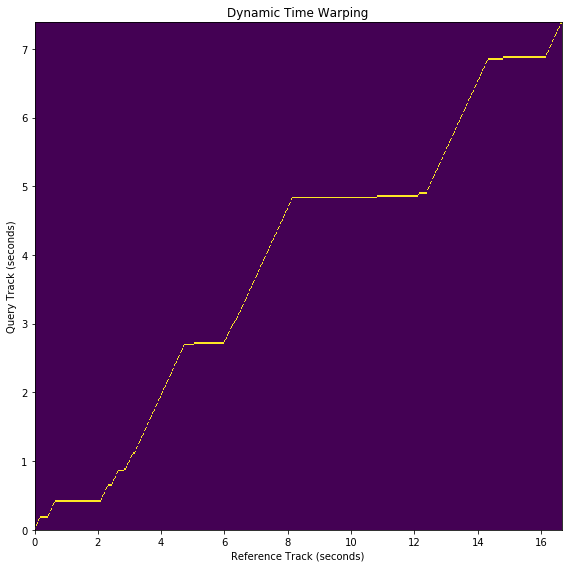

In [24]:
ref = "audio/voice.aif"
query = "audio/drums.aif"

path, data_ref, data_query, fs_ref, fs_query = plot( ref, query )

The R2 score between the dtw path and linear line is  0.9550600257962135


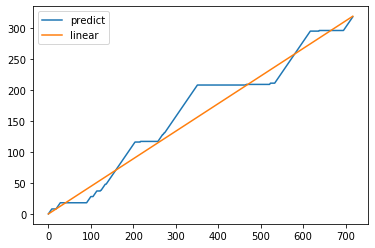

In [25]:
from sklearn.metrics import r2_score

path.shape
line = np.linspace( 0, path.shape[0], path.shape[1] )
predict = np.argmax( path, axis = 0 )

r2 = r2_score(line, predict)

plt.plot(predict, label = "predict")
plt.plot(line, label = "linear")
plt.legend()

print( "The R2 score between the dtw path and linear line is ", r2)

`In contrast, let's compare the linearity of audio1a.wav and audio1b.wav, which is arguably more similar to each other, compared the difference between voice and drum.`

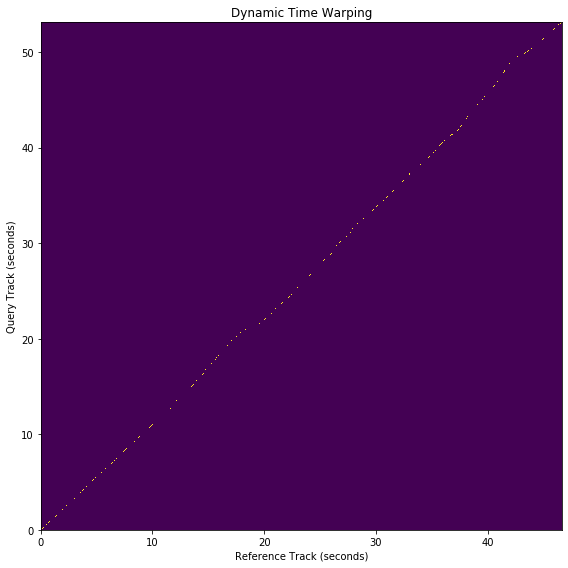

In [26]:
ref = "audio/audio1a.wav"
query = "audio/audio1b.wav"

path, data_ref, data_query, fs_ref, fs_query = plot_with_delta( ref, query )

The R2 score between the dtw path and linear line is  0.9990913022548615


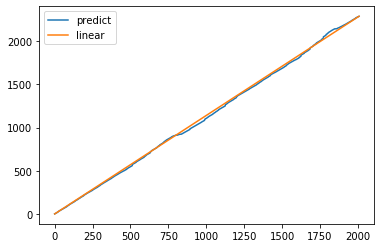

In [27]:
line = np.linspace( 0, path.shape[0], path.shape[1] )
predict = np.argmax( path, axis = 0 )

r2 = r2_score(line, predict)

plt.plot(predict, label = "predict")
plt.plot(line, label = "linear")
plt.legend()

print( "The R2 score between the dtw path and linear line is ", r2)

`We see that this time we have a much more linear result.`

`In conclusion, I think we can use this linearity measure to evaluate how similar two tracks are towards each other. On the other hand, I think it'll need more subjective methods to evaluate the success of the DTW algorithm.`